# Introduction to Search

CSI 4106

Marcel Turcotte  
Version: Jul 10, 2025 16:58

# Preamble

## Quote of the Day

## Learning Objectives

-   **Understand** the role of search algorithms in AI, crucial for
    planning, reasoning, and applications like AlphaGo.

-   **Grasp** key search concepts: state space, initial/goal states,
    actions, transition models, cost functions.

-   **Learn** differences and implementations of uninformed search
    algorithms (BFS and DFS).

-   **Comprehend** informed search strategies and heuristic functions’
    role in search efficiency.

-   **Implement** and compare BFS, DFS, and Best-First Search using the
    8-Puzzle problem.

-   **Analyze** performance and optimality of various search algorithms.

Today’s focus is primarily on providing justification, as well as
introducing key concepts and terminology.

# Justification

## Justification

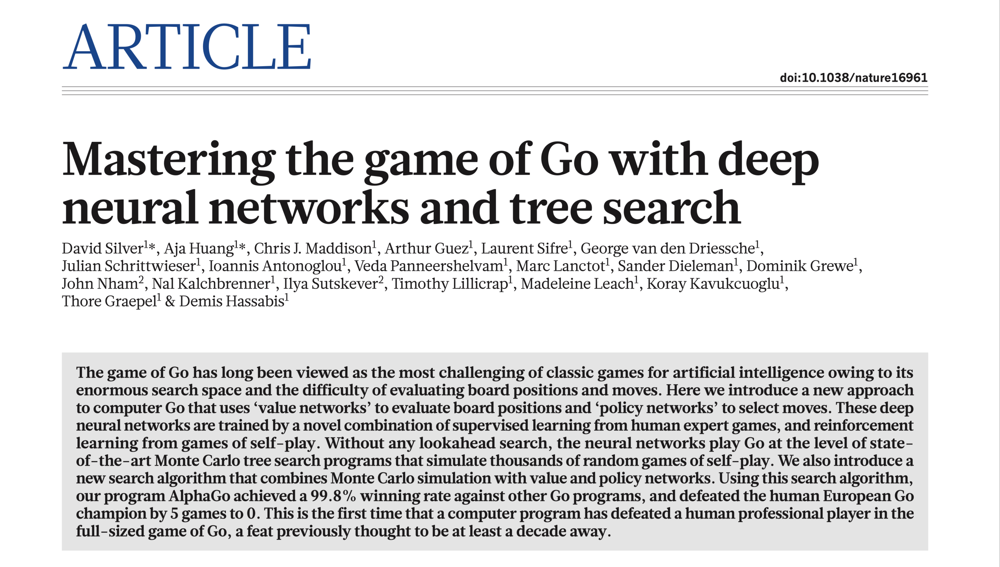

Silver et al. (2016)

## Justification

We have honed our expertise in **machine learning** to a point where we
possess a robust understanding of **neural networks** and **deep
learning**, allowing us to develop simple models using **Keras**.

. . .

In recent years, **Monte Carlo Tree Search (MCTS)** has played a pivotal
role in advancing **artificial intelligence** research. After initially
concentrating on deep learning, **we are now shifting our focus to
search**.

## Justification

The integration of **deep learning** and **MCTS** underpins modern
applications such as
**[AlphaGo](https://deepmind.google/research/breakthroughs/alphago/)**,
**[AlphaZero](https://deepmind.google/discover/blog/alphazero-shedding-new-light-on-chess-shogi-and-go/)**,
and
**[MuZero](https://deepmind.google/discover/blog/muzero-mastering-go-chess-shogi-and-atari-without-rules/)**.

. . .

Search algorithms are crucial in addressing challenges in **planning**
and **reasoning** and are likely to become **increasingly significant in
future developments**.

## Search (a biased timeline)

-   **1968 – A\***: Heuristic-based search, foundational for pathfinding
    and planning in AI.
-   **1970s-1980s – Population-Based Algorithms** (e.g., Genetic
    Algorithms): Stochastic optimization approaches useful for large,
    complex search spaces.
-   **1980s – Constraint Satisfaction Problems (CSPs)**: Search in
    structured spaces with explicit constraints; a precursor to formal
    problem-solving systems.
-   **2013 – DQN**: Reinforcement learning via search (Q-learning) from
    raw input (pixels).
-   **2015 – AlphaGo**: Game-tree search with Monte Carlo Tree Search
    (MCTS) combined with deep learning.
-   **2017 – AlphaZero**: Generalized self-play with MCTS in multiple
    domains.
-   **2019 – MuZero**: Search in unknown environments without predefined
    models.
-   **2020 – Agent57**: Generalized search across multiple environments
    (Atari games).
-   **2020 – AlphaGeometry**: Search-based theorem proving in
    mathematical spaces.
-   **2021 – FunSearch**: Potentially another generalization of search
    techniques.

## Search

<https://youtu.be/g-dKXOlsf98>

[The computer that mastered Go](https://youtu.be/g-dKXOlsf98). [Nature
Video](https://www.youtube.com/@NatureVideoChannel) posted on YouTube on
2016-01-27. (7**m** 52**s**)

In 1997, IBM’s Deep Blue defeated the reigning world chess champion,
Garry Kasparov. However, the AI community was not particularly
impressed, as the system’s primary accomplishment lay in its ability to
evaluate 200 million chess positions per second. Following the match,
Kasparov remarked that Deep Blue was “as intelligent as your alarm
clock.”

Since then, significant advancements have been made. Unlike Deep Blue,
AlphaZero relies on “more interesting approaches than brute-force
search, which are perhaps more human-like in the way that they deal with
the position.” This prompted Kasparov to express his approval, stating,
“I can’t hide my satisfaction that \[AlphaZero\] plays with a dynamic
style reminiscent of my own!”

## AlphaGo - The Movie

<https://youtu.be/WXuK6gekU1Y>

Yes, **AlphaGo** successfully defeated the **world champion**, Lee
**Sedol**. (1**h** 30**m**)

## AlphaGo2MuZero

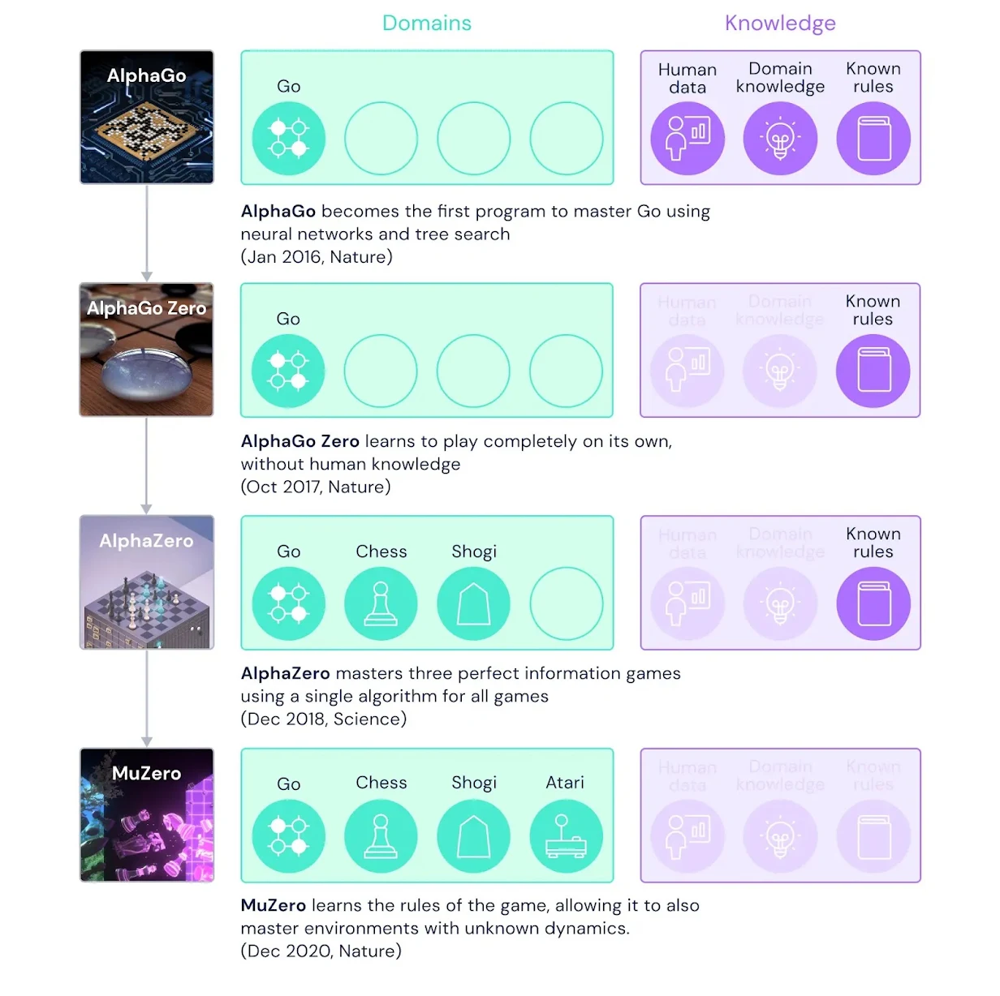

**Attribution**: [MuZero: Mastering Go, chess, shogi and Atari without
rules](https://deepmind.google/discover/blog/muzero-mastering-go-chess-shogi-and-atari-without-rules/),
Google DeepMind, 2020-12-23. Schrittwieser et al. (2020)

[David Silver](https://www.davidsilver.uk), a principal research
scientist at DeepMind and a professor at University College London, is
one of the leading researchers on these projects. He earned his PhD at
the University of Alberta, where he was supervised by [Richard
Sutton](https://apps.ualberta.ca/directory/person/rsutton).

You might also want to watch the following video: [AlphaGo Zero:
Discovering new
knowledge](https://youtu.be/WXHFqTvfFSw?si=oXsOtb2uxvU1CyKb). Posted on
YouTube on 2017-10-18.

# Search

## Applications

-   **Pathfinding and Navigation**: Used in robotics and video games to
    find a **path** from a **starting point** to a **destination**.
-   **Puzzle Solving**: Solving puzzles like the **8-puzzle**,
    **mazes**, or **Sudoku**.
-   **Network Analysis**: Analyzing networks and graphs, such as finding
    **connectivity** or **shortest paths** in **social networks** or
    **transportation maps**.
-   **Game Playing**: Used to evaluate moves in games like **chess** or
    **Go**, especially when combined with other strategies.

## Applications

-   **Scheduling**: Planning and scheduling tasks in **manufacturing**,
    **project management**, or **airline scheduling**.
-   **Resource Allocation**: Allocating resources in a network or within
    an organization where **constraints** must be satisfied.
-   **Configuration Problems**: Solving problems where a set of
    components must be assembled to meet specific requirements, such as
    configuring a computer system or **designing a circuit**.

## Applications

-   **Decision Making under Uncertainty**: Used in **real-time strategy
    games** and **simulations** where decisions need to be evaluated
    under uncertain conditions.

-   **Storrytelling**: LLMs can effectively generate stories when guided
    by a valid input plan from an **automated planner**. (Simon and
    Muise 2024)

The applications of search algorithms are both **numerous** and
**diverse**.

Search has been an active area of research not only because of its wide
range of applications but also due to the potential for improvements in
algorithms to significantly reduce program execution time or facilitate
the exploration of larger search spaces.

## Outline

1.  **Deterministic & Heuristic Search**: BFS, DFS, A\* for pathfinding
    and optimization in classical AI.

2.  **CSPs & Population-Based Algorithms**: Focus on structured problems
    and stochastic search.

3.  **Adversarial Game Algorithms**: Minimax, alpha-beta pruning, MCTS
    for decision-making in competitive environments.

This lecture and the upcoming ones will thoroughly cover these topics.

## Definition

> ** (Russell and Norvig 2020, 63)**
>
> When the correct action to take is not immediately obvious, an agent
> may need to to **plan ahead**: to consider a **sequence of actions**
> that form a **path** to a **goal state**. Such an agent is called a
> **problem-solving agent**, and the computational process it undertakes
> is called **search**.

## Terminology

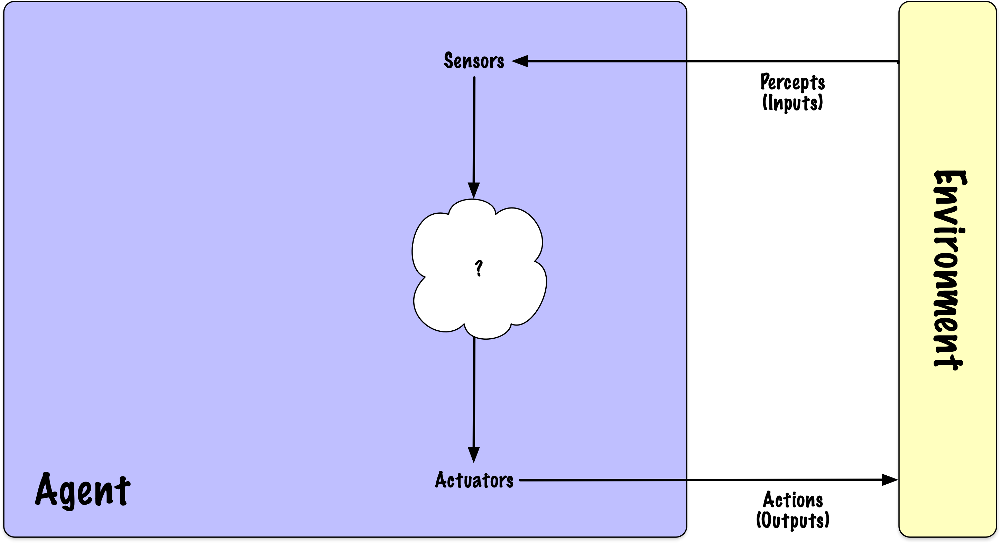

An **agent** is an entity that performs **actions**. A **rational
agent** is one that acts to achieve the **“best” outcome**.
Conceptually, an **agent** perceives its environment through **sensors**
and interacts with it using **actuators**.

The definition of an agent in **artificial intelligence (AI)** shares
some similarities with the **psychological** definition, but there are
key distinctions. In AI, an agent is an **autonomous entity** that
perceives its **environment** through **sensors** and acts upon it using
**actuators** to achieve specific **goals**. Both definitions involve
**perception**, **decision-making**, and **action**.

However, while psychological agents are human or biological and involve
**complex cognitive** and **emotional processes**, AI agents are
computational and operate based on algorithms designed to **maximize
certain performance measures** or **achieve predefined objectives**. The
focus in AI is more on the technical implementation of these processes,
whereas in psychology, the emphasis is on understanding the cognitive
and motivational aspects of agency.

The concept of **agentic design** in software engineering and artificial
intelligence has experienced a resurgence in popularity.

## Environment Characteristics

-   **Observability**: Partially observable, or *fully observable*
-   **Agent Composition**: *Single* or multiple agents
-   **Predictability**: *Deterministic* or non-deterministic
-   **State Dependency**: *Stateless* or stateful
-   **Temporal Dynamics**: *Static* or dynamic
-   **State Representation**: *Discrete* or continuous

In this lecture, environments are assumed to be: *fully observable*,
*single agent*, *stateless*, *deterministic*, *static*, and *discrete*.

The characteristics of an environment influence the complexity of
problem-solving.

-   A **fully observable environment** allows the agent to detect all
    relevant aspects for decision-making.

-   In a **deterministic environment**, the agent can predict the next
    state based on the current state and its subsequent action.

-   **Stateless (Episodic) Environments** involve decisions or actions
    that are independent of prior actions, with experiences divided into
    unrelated episodes. An example is a classification problem.

-   **Stateful (Sequential) Environments** require that each action’s
    outcome can affect future decisions, as the sequence of actions
    impacts the state and subsequent choices. An example is a chess
    game.

-   A **dynamic environment** is characterized by changes in context
    while the agent is deliberating.

-   Chess serves as an example of a **discrete environment**, with a
    finite, though large, number of states. In contrast, an autonomous
    vehicle operates within a **continuous-state** and **continuous-time
    environment**.

## Problem-Solving Process

**Search**: The process involves simulating sequences of actions until
the agent achieves its goal. A successful sequence is termed a
**solution**.

A precise formulation facilitates the development of reusable code.

An environment characterized as stateless, single-agent, fully
observable, deterministic, static, and discrete implies that the
solution to any problem within this context is a fixed sequence of
actions.

-   **Stateless**: Each decision is independent of previous actions,
    meaning the solution does not depend on history.
-   **Single Agent**: There is no interaction with other agents that
    could introduce variability.
-   **Fully Observable**: The agent has complete information about the
    environment, allowing for precise decision-making.
-   **Deterministic**: The outcome of actions is predictable, with no
    randomness affecting the result.
-   **Static**: The environment does not change over time, so the
    conditions remain constant.
-   **Discrete**: The environment has a finite number of states and
    actions, enabling a clear sequence of steps.

I anticipate that you are already familiar with these concepts, and
thus, this initial lecture primarily serves as a review.

## Search Problem Definition

-   A collection of **states**, referred to as the **state space**.

-   An **initial state** where the agent begins.

-   One or more **goal states** that define successful outcomes.

-   A set of **actions** available in a given state $s$.

-   A **transition model** that determines the next state based on the
    current state and selected action.

-   An **action cost function** that specifies the cost of performing
    action $a$ in state $s$ to reach state $s'$.

## Definitions

-   A **path** is defined as a sequence of actions.
-   A **solution** is a path that connects the initial state to the goal
    state.
-   An **optimal solution** is the path with the lowest cost among all
    possible solutions.

We assume that the **path cost** is the sum of the individual action
costs, and all costs are positive. The state space can be conceptualized
as a **graph**, where the nodes represent the states and the edges
correspond to the actions.

In certain problems, multiple optimal solutions may exist. However, it
is typically sufficient to identify and report a single optimal
solution. Providing all optimal solutions can significantly increase
time and space complexity for some problems.

## Example: 8-Puzzle

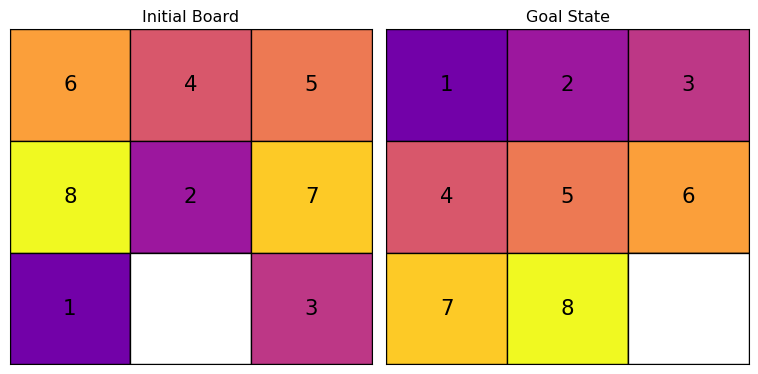

## 8-Puzzle

-   How can the **states** be represented?

-   What constitutes the **initial state**?

-   What defines the **actions**?

-   What would constitute a **path**?

-   What characterizes the **goal state**?

-   What would constitute a **solution**?

-   What should be the **cost of an action**?

-   Each state can be represented as a list containing the numbers 0
    to 8. Each number corresponds to a tile, and its position in the
    list reflects its location in the grid, with 0 denoting the blank
    space.

-   The initial state is a permutation of the numbers 0 to 8.

-   Actions include **left**, **right**, **up**, and **down**, which
    involve sliding an adjacent tile into the blank space.

-   A path would be a sequence of actions, say **left**, **left**,
    **up**.

-   The transition model maps a given state and action to a new state.
    Not all actions are feasible from every state; for instance, if the
    blank space is at the edge of the grid, only certain moves are
    possible, such as down, up, or left.

-   The goal state is achieved when the list is ordered from 1 to 8,
    followed by 0, indicating that the tiles are arranged correctly. How
    many goal states are there?

-   A solution would be a valid path transforming an initial state into
    a goal state.

-   Each action incurs a cost of 1.

How many possible states are there?

There are 9! = 362,880 states. Brut force is feasible.

How many states are there for the 15-Puzzle?

15! = 1,307,674,368,000 (1.3 trillion)!

## Search Tree

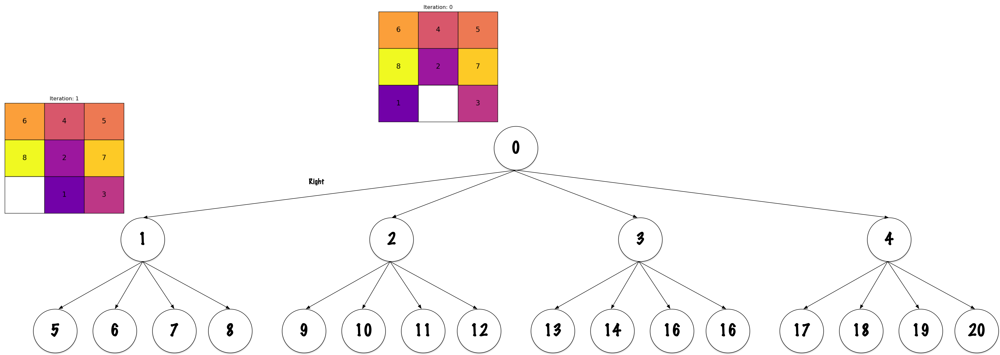

A **search tree** is a *conceptual tree structure* where **nodes**
represent *states* in a **state space**, and **edges** represent
possible **actions**, facilitating systematic exploration to find a
**path** from an **initial state** to a **goal state**.

The search algorithms we examine today construct a search tree, where
each node represents a state within the state space and each edge
represents an action.

It is important to distinguish between the search tree and the state
space, which can be depicted as a graph. The structure of the search
tree varies depending on the algorithm employed to address the search
problem.

## Search Tree



An example of a **search tree** for the **8-Puzzle**. The solution here
is incomplete.

## Search Tree

-   The **root** of the search tree represents the **initial state** of
    the problem.

-   **Expanding** a node involves evaluating **all possible actions**
    available from that state.

-   The **result** of an action is the new state achieved after
    **applying that action** to the **current state**.

-   Similar to other tree structures, each node (except for the **root**
    and **leaf** nodes) has a **parent** and may have **children**.

A distinctive feature of a search algorithm is its method for
**selecting the next node to expand**.

## Frontier



Any state corresponding to a node in the search tree is considered
**reached**. **Frontier** nodes are those that have been **reached** but
have **not yet been expanded**. Above, there are **10 expanded nodes**
and **11 frontier nodes**, resulting in a total of 21 nodes that have
been **reached**.

## Frontier

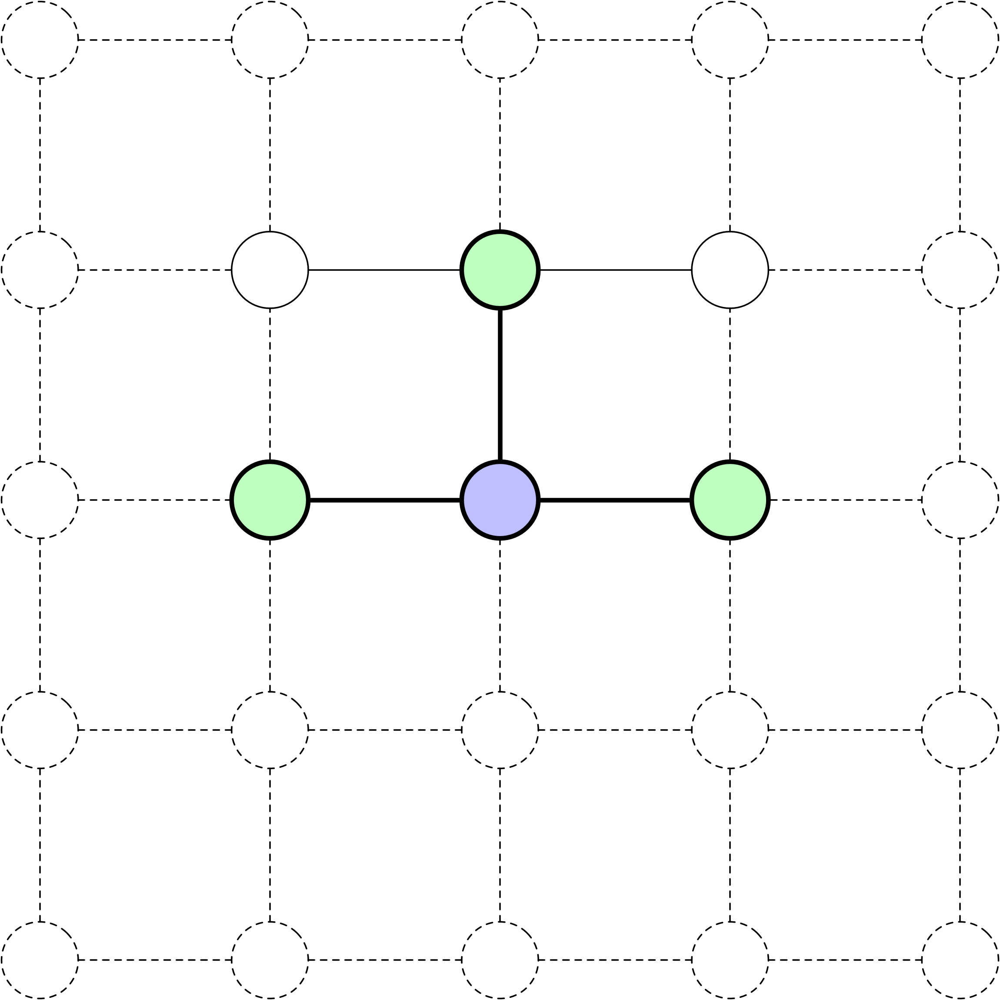

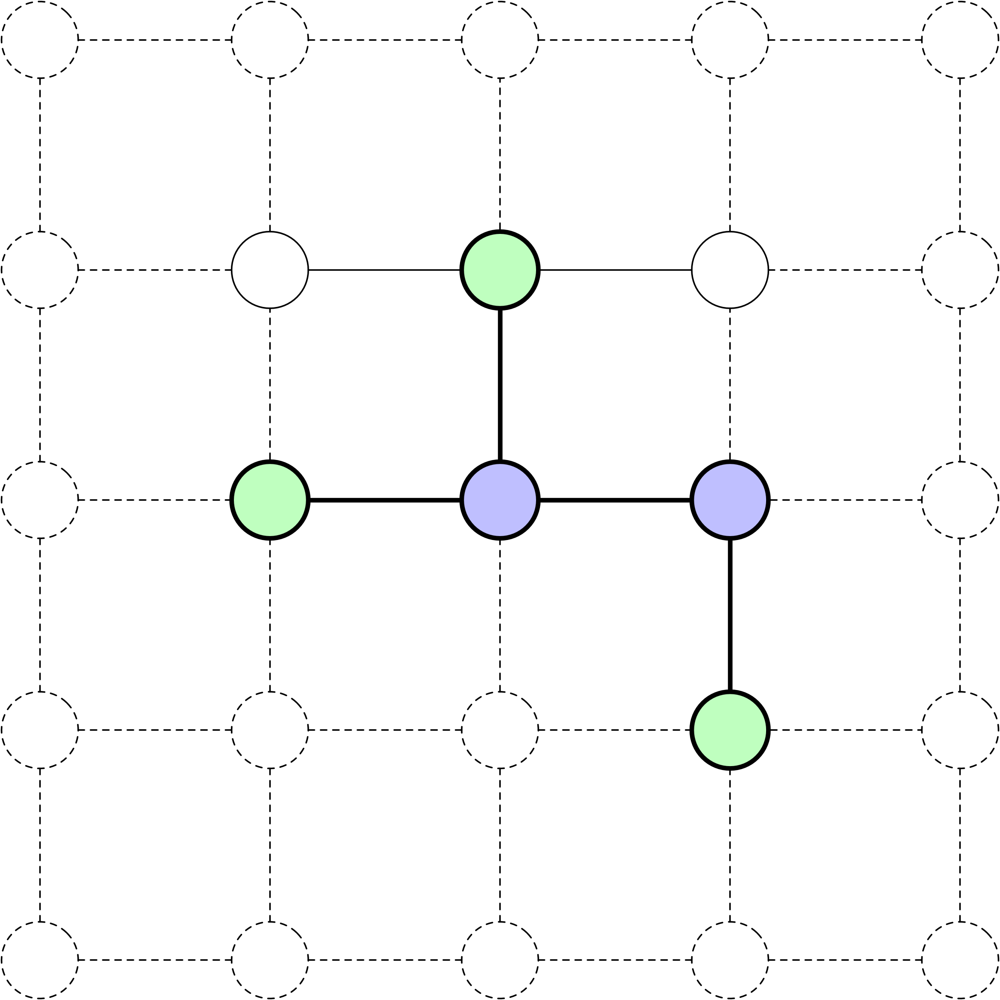

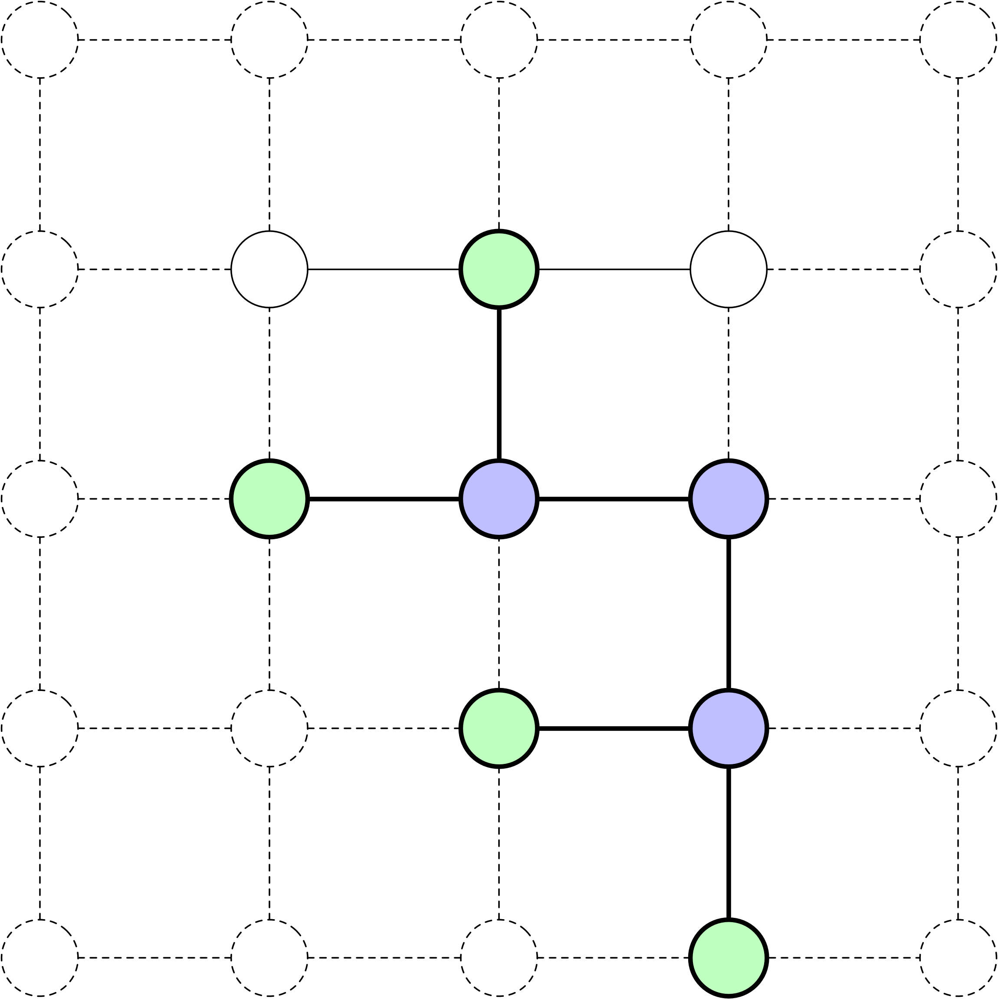

In the 8-Puzzle, four actions are possible: slide **left**, **right**,
**up**, or **down**. The search can be visualized on a grid: **purple
nodes**: expanded states, **green nodes**: frontier states (reached but
not expanded).

The diagrams correspond to the search tree presented on the previous
page. For example, the initial state can be expanded using three
actions: slide left, right, and up. Node (2, 3) can only be expanded by
sliding down, while node (3, 3) can be expanded by sliding left and
down.

## Frontier

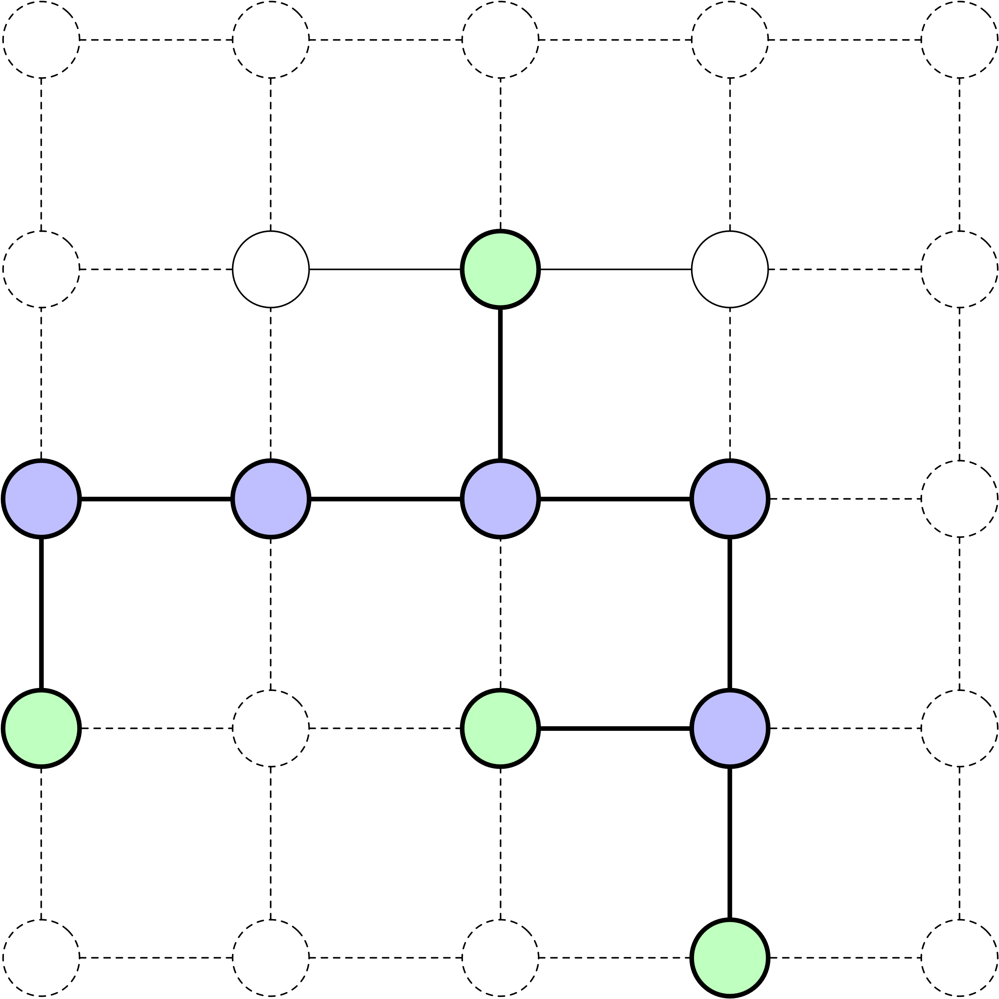

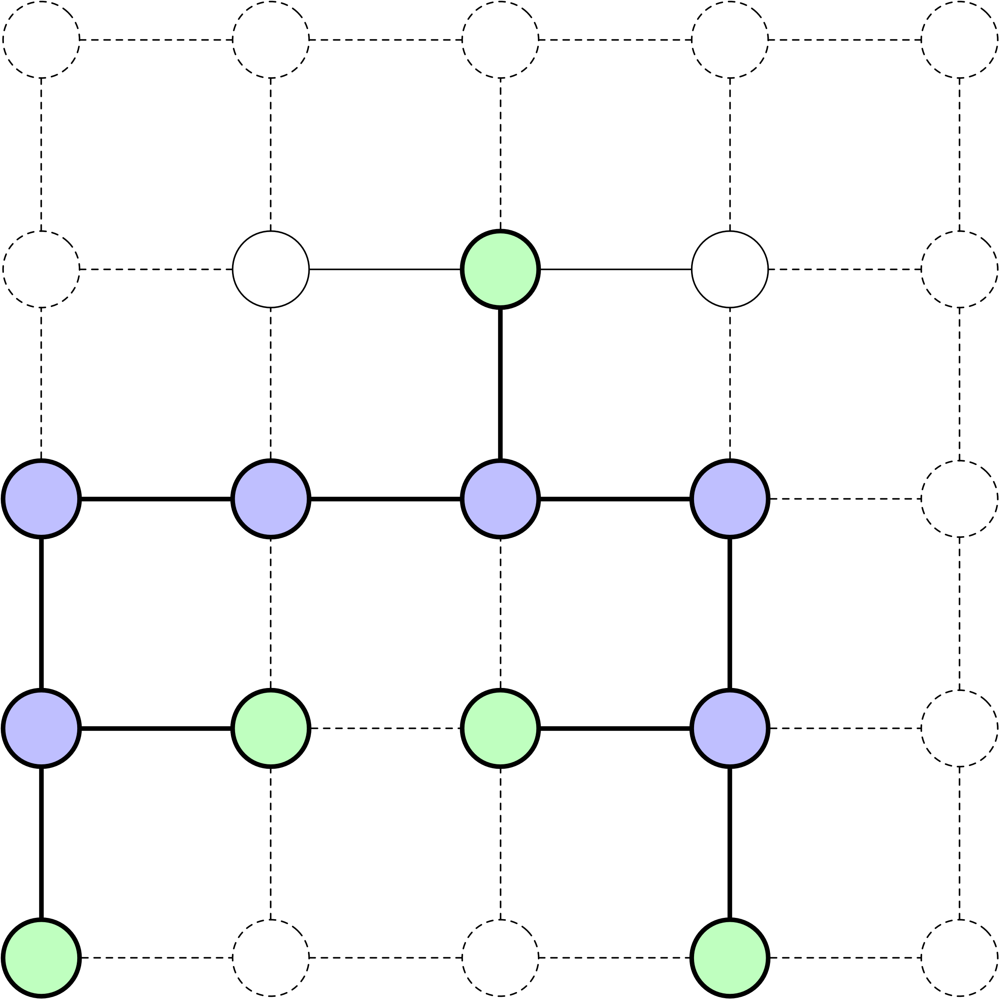

# Uninformed search

## Definition

An **uninformed search** is a search strategy that explores the search
space using only the information available in the problem definition,
without any domain-specific knowledge, evaluating nodes based solely on
their inherent properties rather than estimated costs or heuristics.

## State Representation

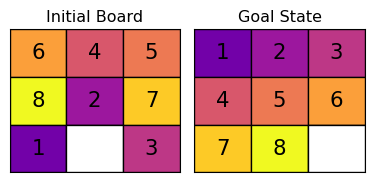

In [4]:
initial_state_8 = [6, 4, 5,
                   8, 2, 7,
                   1, 0, 3]

goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

The states are represented as **lists** of numbers. `0` represents the
**blank tile**.

## `is_goal`

In [5]:
def is_goal(state, goal_state):
    """Determines if a given state matches the goal state."""
    return state == goal_state

Auxilliary method.

## `expand`

In [6]:
def expand(state):
    """Generates successor states by moving the blank tile in all possible directions."""
    size = int(len(state) ** 0.5)  # Determine puzzle size (3 for 8-puzzle, 4 for 15-puzzle)
    idx = state.index(0)  # Find the index of the blank tile represented by 0
    x, y = idx % size, idx // size  # Convert index to (x, y) coordinates
    neighbors = []

    # Define possible moves: Left, Right, Up, Down
    moves = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    for dx, dy in moves:
        nx, ny = x + dx, y + dy
        # Check if the new position is within the puzzle boundaries
        if 0 <= nx < size and 0 <= ny < size:
            n_idx = ny * size + nx
            new_state = state.copy()
            # Swap the blank tile with the adjacent tile
            new_state[idx], new_state[n_idx] = new_state[n_idx], new_state[idx]
            neighbors.append(new_state)
    return neighbors

## `expand`

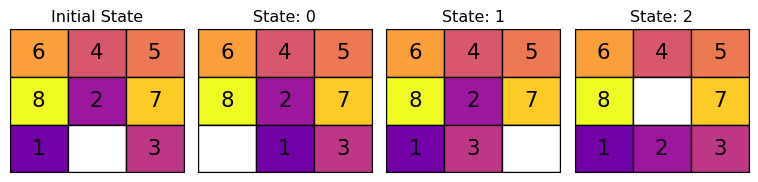

In [8]:
expand(initial_state_8)

[[6, 4, 5, 8, 2, 7, 0, 1, 3],
 [6, 4, 5, 8, 2, 7, 1, 3, 0],
 [6, 4, 5, 8, 0, 7, 1, 2, 3]]

## `is_empty`

In [9]:
def is_empty(frontier):
    """Checks if the frontier is empty."""
    return len(frontier) == 0

If the frontier becomes empty (no more nodes to be expanded), the
problem has no solution.

Are there 8-Puzzle boards that have no solutions?

The solvability of the 8-puzzle depends on the number of **inversions**
in the initial state. An inversion is a pair of tiles where a
higher-numbered tile precedes a lower-numbered tile when the puzzle is
viewed as a sequence (excluding the blank tile).

## `print_solution`

In [10]:
def print_solution(solution):
    """Prints the sequence of steps from the initial to the goal state."""
    size = int(len(solution[0]) ** 0.5)
    for step, state in enumerate(solution):
        print(f"Step {step}:")
        for i in range(size):
            row = state[i*size:(i+1)*size]
            print(' '.join(str(n) if n != 0 else ' ' for n in row))
        print()

## Cycles

A path that revisits the same states forms a **cycle**.

Allowing cycles would render the resulting **search tree** **infinite**.

To prevent this, we monitor the states that have been reached, though
this incurs a **memory cost**.

# Breadth-first search

## Breadth-first search

In [11]:
from collections import deque

**Breadth-first search (BFS)** employs a **queue** to manage the
frontier nodes, which are also known as the open list.

## Breadth-first search

In [12]:
def bfs(initial_state, goal_state):

    frontier = deque()  # Initialize the queue for BFS
    frontier.append((initial_state, []))  # Each element is a tuple: (state, path)

    explored = set()
    explored.add(tuple(initial_state))

    iterations = 0 # simply used to compare algorithms

    while not is_empty(frontier):
        current_state, path = frontier.popleft()

        if is_goal(current_state, goal_state):
            print(f"Number of iterations: {iterations}")
            return path + [current_state]  # Return the successful path

        iterations = iterations + 1

        for neighbor in expand(current_state):
            neighbor_tuple = tuple(neighbor)
            if neighbor_tuple not in explored:
                explored.add(neighbor_tuple)
                frontier.append((neighbor, path + [current_state]))

    return None  # No solution found

Find the **shortest path** from the initial state to the goal state.

## Simple Case

Number of iterations: 12

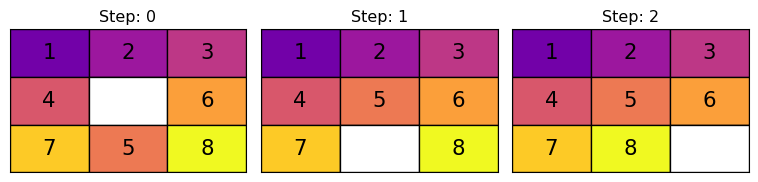

In [14]:
initial_state_8 = [1, 2, 3,
                    4, 0, 6,
                    7, 5, 8]
goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

bfs(initial_state_8, goal_state_8)

Number of iterations: 12

[[1, 2, 3, 4, 0, 6, 7, 5, 8],
 [1, 2, 3, 4, 5, 6, 7, 0, 8],
 [1, 2, 3, 4, 5, 6, 7, 8, 0]]

## Challenging Case

In [15]:
initial_state_8 = [6, 4, 5,
                   8, 2, 7,
                   1, 0, 3]
goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

print("Solving 8-puzzle with BFS...")

solution_8_bfs = bfs(initial_state_8, goal_state_8)

if solution_8_bfs:
    print(f"BFS Solution found in {len(solution_8_bfs) - 1} moves:")
    print_solution(solution_8_bfs)
else:
    print("No solution found for 8-puzzle using BFS.")

Solving 8-puzzle with BFS...
Number of iterations: 145605
BFS Solution found in 25 moves:
Step 0:
6 4 5
8 2 7
1   3

Step 1:
6 4 5
8 2 7
  1 3

Step 2:
6 4 5
  2 7
8 1 3

Step 3:
6 4 5
2   7
8 1 3

Step 4:
6   5
2 4 7
8 1 3

Step 5:
  6 5
2 4 7
8 1 3

Step 6:
2 6 5
  4 7
8 1 3

Step 7:
2 6 5
4   7
8 1 3

Step 8:
2 6 5
4 1 7
8   3

Step 9:
2 6 5
4 1 7
  8 3

Step 10:
2 6 5
  1 7
4 8 3

Step 11:
2 6 5
1   7
4 8 3

Step 12:
2 6 5
1 7  
4 8 3

Step 13:
2 6 5
1 7 3
4 8  

Step 14:
2 6 5
1 7 3
4   8

Step 15:
2 6 5
1   3
4 7 8

Step 16:
2   5
1 6 3
4 7 8

Step 17:
2 5  
1 6 3
4 7 8

Step 18:
2 5 3
1 6  
4 7 8

Step 19:
2 5 3
1   6
4 7 8

Step 20:
2   3
1 5 6
4 7 8

Step 21:
  2 3
1 5 6
4 7 8

Step 22:
1 2 3
  5 6
4 7 8

Step 23:
1 2 3
4 5 6
  7 8

Step 24:
1 2 3
4 5 6
7   8

Step 25:
1 2 3
4 5 6
7 8  


## BFS Search Tree



The search tree above illustrates the first 20 iterations of the
breadth-first search (BFS) for the specified initial goal.

# Depth-First Search

## Depth-First Search

In [16]:
def dfs(initial_state, goal_state):

    frontier = [(initial_state, [])]  # Each element is a tuple: (state, path)

    explored = set()
    explored.add(tuple(initial_state))

    iterations = 0

    while not is_empty(frontier):
        current_state, path = frontier.pop()

        if is_goal(current_state, goal_state):
            print(f"Number of iterations: {iterations}")
            return path + [current_state]  # Return the successful path

        iterations = iterations + 1

        for neighbor in expand(current_state):
            neighbor_tuple = tuple(neighbor)
            if neighbor_tuple not in explored:
                explored.add(neighbor_tuple)
                frontier.append((neighbor, path + [current_state]))

    return None  # No solution found

What is the behaviour of **depth-First Search (dfs)**?

**Depth-First Search (DFS)** consistently expands the deepest node.

When does the deepening process halt?

It ceases when all child nodes correspond to states that have already
been visited.

What happens next?

The algorithm backtracks to the most recent frontier node.

If all children of this node also correspond to previously visited
states, the algorithm continues to backtrack further.

## DFS Search Tree

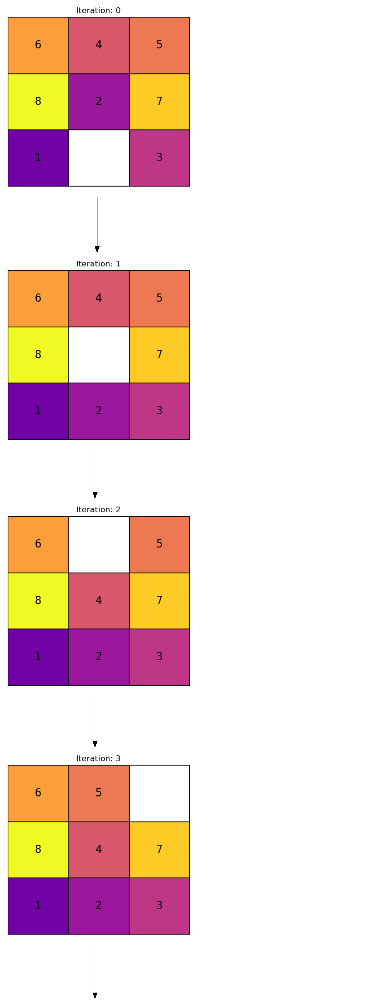

## DFS Search Tree

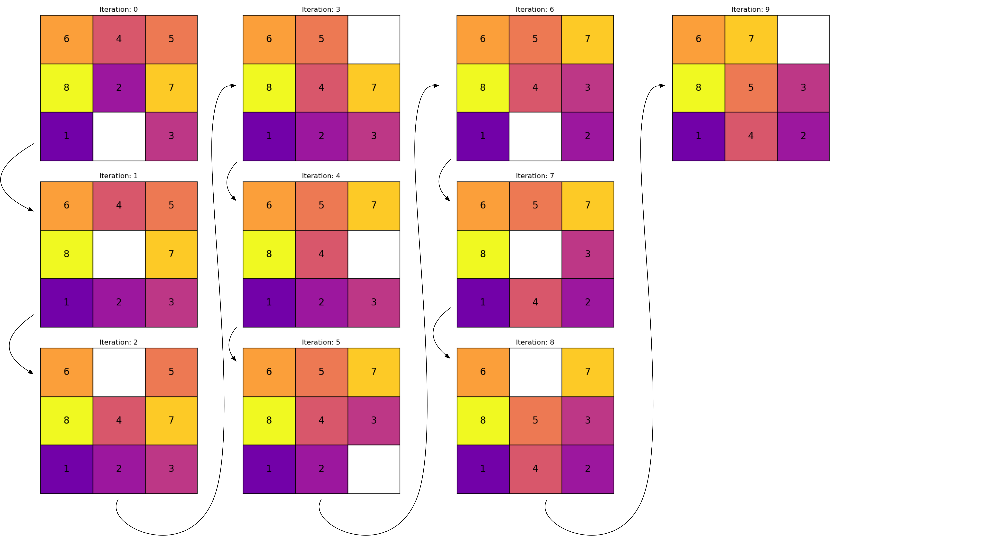

## Simple Case

Number of iterations: 2

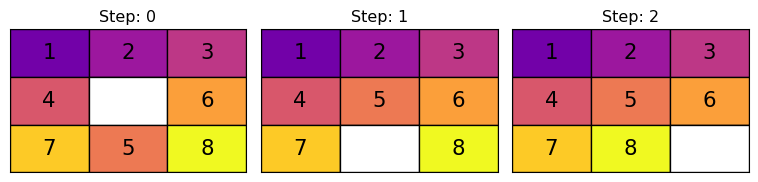

In [18]:
initial_state_8 = [1, 2, 3,
                    4, 0, 6,
                    7, 5, 8]
goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

bfs(initial_state_8, goal_state_8)

Number of iterations: 12

[[1, 2, 3, 4, 0, 6, 7, 5, 8],
 [1, 2, 3, 4, 5, 6, 7, 0, 8],
 [1, 2, 3, 4, 5, 6, 7, 8, 0]]

## Challenging Case

In [19]:
initial_state_8 = [6, 4, 5,
                   8, 2, 7,
                   1, 0, 3]
goal_state_8 = [1, 2, 3,
                4, 5, 6,
                7, 8, 0]

print("Solving 8-puzzle with DFS...")

solution_8_bfs = dfs(initial_state_8, goal_state_8)

if solution_8_bfs:
    print(f"DFS Solution found in {len(solution_8_bfs) - 1} moves:")
    print_solution(solution_8_bfs)
else:
    print("No solution found for 8-puzzle using DFS.")

Solving 8-puzzle with DFS...
Number of iterations: 1187
DFS Solution found in 1157 moves:
Step 0:
6 4 5
8 2 7
1   3

Step 1:
6 4 5
8   7
1 2 3

Step 2:
6   5
8 4 7
1 2 3

Step 3:
6 5  
8 4 7
1 2 3

Step 4:
6 5 7
8 4  
1 2 3

Step 5:
6 5 7
8 4 3
1 2  

Step 6:
6 5 7
8 4 3
1   2

Step 7:
6 5 7
8   3
1 4 2

Step 8:
6   7
8 5 3
1 4 2

Step 9:
6 7  
8 5 3
1 4 2

Step 10:
6 7 3
8 5  
1 4 2

Step 11:
6 7 3
8 5 2
1 4  

Step 12:
6 7 3
8 5 2
1   4

Step 13:
6 7 3
8   2
1 5 4

Step 14:
6   3
8 7 2
1 5 4

Step 15:
6 3  
8 7 2
1 5 4

Step 16:
6 3 2
8 7  
1 5 4

Step 17:
6 3 2
8 7 4
1 5  

Step 18:
6 3 2
8 7 4
1   5

Step 19:
6 3 2
8   4
1 7 5

Step 20:
6   2
8 3 4
1 7 5

Step 21:
6 2  
8 3 4
1 7 5

Step 22:
6 2 4
8 3  
1 7 5

Step 23:
6 2 4
8 3 5
1 7  

Step 24:
6 2 4
8 3 5
1   7

Step 25:
6 2 4
8   5
1 3 7

Step 26:
6   4
8 2 5
1 3 7

Step 27:
6 4  
8 2 5
1 3 7

Step 28:
6 4 5
8 2  
1 3 7

Step 29:
6 4 5
8   2
1 3 7

Step 30:
6 4 5
8 3 2
1   7

Step 31:
6 4 5
8 3 2
1 7  

Step 32:
6 4 5
8 3  
1 7

## Remarks

-   **Breadth-first search (BFS)** identifies the optimal solution, 25
    moves, in 145,605 iterations.

-   **Depth-first search (DFS)** discovers a solution involving 1,157
    moves in 1,187 iterations.

How can solutions be discovered **more efficiently**?

Will **Depth-First Search (DFS)** invariably yield sub-optimal
solutions?

No, if the optimal solution lies along the path traversed by depth-first
search (DFS) within the search tree, then DFS will indeed identify the
optimal solution.

Is it possible for DFS to discover solutions superior to the optimal
solution?

Certainly not; such solutions would either be invalid (involving
impossible moves) or indicate an error in your estimation.

Does this imply that depth-first search (DFS) has no practical
applications?

When is it appropriate to use DFS?

Breadth-first search (BFS) expands its frontier systematically in all
directions, leading to rapid growth in memory requirements.

In contrast, the memory usage of DFS is constrained by the number of
moves needed to reach its backtracking points or the path length of the
first solution found. In all scenarios, DFS continues expanding the
frontier in one direction.

In certain applications where all possible solutions must be explored,
the entire search space must be traversed. Using BFS in these cases
would be prohibitively expensive in terms of memory. However, DFS can
explore the entire space with minimal memory usage.

The programming language Prolog includes a built-in backtracking
algorithm that enumerates all possible solutions. Backtracking is a
memory-efficient variant of DFS.

Depth-limited and iterative deepening search would be alternative
uninformed search algorithms.

Finding solutions more efficiently requires domain knowledge.

# Prologue

## Summary

-   Justification for Studying Search
-   Key Terminology and Concepts
-   Uninformed Search Algorithms
    -   Breadth-First Search (BFS)
    -   Depth-First Search (DFS)
-   Implementations

-   **Justification for Studying Search:**
    -   Emphasized the shift from solely focusing on machine learning to
        incorporating search algorithms.
    -   Highlighted the role of search in advanced AI systems like
        AlphaGo, AlphaZero, and MuZero.
    -   Noted that search algorithms are crucial for planning,
        reasoning, and will be increasingly significant.
-   **Historical Timeline of Search Algorithms:**
    -   Presented a biased timeline from 1968’s A\* algorithm to recent
        developments like MuZero and Agent57.
    -   Showed the evolution from heuristic-based search to integrating
        deep learning with search methods.
-   **Applications of Search:**
    -   **Pathfinding and Navigation:** Finding optimal paths in
        robotics and games.
    -   **Puzzle Solving:** Solving problems like the 8-puzzle and
        Sudoku.
    -   **Network Analysis:** Analyzing connectivity and shortest paths
        in networks.
    -   **Game Playing:** Evaluating moves in games like chess or Go.
    -   **Scheduling and Resource Allocation:** Planning tasks and
        allocating resources efficiently.
    -   **Configuration Problems:** Assembling components to meet
        specific requirements.
    -   **Decision Making under Uncertainty:** Making decisions in
        dynamic and uncertain environments.
    -   **Storytelling:** Guiding language models with plans from
        automated planners.
-   **Key Terminology and Concepts:**
    -   **Agent:** An entity that performs actions to achieve goals.
    -   **Environment Characteristics:** Fully observable, single-agent,
        deterministic, static, and discrete environments were focused
        on.
    -   **Search Problem Definition:**
        -   **State Space:** All possible states.
        -   **Initial State:** Where the agent starts.
        -   **Goal State(s):** Desired outcome(s).
        -   **Actions:** Possible moves from a state.
        -   **Transition Model:** Rules determining state changes.
        -   **Action Cost Function:** Cost associated with actions.
-   **Uninformed Search Algorithms:**
    -   **Breadth-First Search (BFS):**
        -   Explores the search space level by level.
        -   Guarantees the shortest path but can be memory-intensive.
        -   Implemented using a queue.
    -   **Depth-First Search (DFS):**
        -   Explores as deep as possible along each branch before
            backtracking.
        -   Less memory usage but may not find the shortest path.
        -   Implemented using a stack.
-   **Implementing Uninformed Search:**
    -   Used the **8-Puzzle** as an example problem.
    -   Represented states as lists of numbers, with `0` as the blank
        tile.
    -   Demonstrated BFS and DFS implementations in Python.
    -   Showed that BFS found the optimal solution in more iterations,
        while DFS found a suboptimal solution faster.
-   **Limitations of Uninformed Search:**
    -   Inefficient for large or complex problems due to exhaustive
        nature.
    -   Lack of domain knowledge leads to unnecessary exploration.

## Next lecture

-   We will further explore heuristic functions and examine additional
    search algorithms.

## References

Russell, Stuart, and Peter Norvig. 2020. *Artificial Intelligence: A
Modern Approach*. 4th ed. Pearson. <http://aima.cs.berkeley.edu/>.

Schrittwieser, Julian, Ioannis Antonoglou, Thomas Hubert, Karen
Simonyan, Laurent Sifre, Simon Schmitt, Arthur Guez, et al. 2020.
“<span class="nocase">Mastering Atari, Go, chess and shogi by planning
with a learned model</span>.” *Nature* 588 (7839): 604–9.
<https://doi.org/10.1038/s41586-020-03051-4>.

Silver, David, Aja Huang, Chris J. Maddison, Arthur Guez, Laurent Sifre,
George van den Driessche, Julian Schrittwieser, et al. 2016.
“<span class="nocase">Mastering the game of Go with deep neural networks
and tree search</span>.” *Nature* 529 (7587): 484–89.
<https://doi.org/10.1038/nature16961>.

Simon, Nisha, and Christian Muise. 2024. “Want To Choose Your Own
Adventure? Then First Make a Plan.” *Proceedings of the Canadian
Conference on Artificial Intelligence*.

------------------------------------------------------------------------

Marcel **Turcotte**

<Marcel.Turcotte@uOttawa.ca>

School of Electrical Engineering and **Computer Science** (EE**CS**)

University of Ottawa